# Project: Wrangling and Analyze Data

### import required libraries.

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns 

import tweepy
import json
from timeit import default_timer as timer
import ast

import warnings 
warnings.filterwarnings('ignore')

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [2]:
twitter_archive_enhanced_df = pd.read_csv('twitter-archive-enhanced.csv', sep=',')
twitter_archive_enhanced_df.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [3]:
image_predictions = pd.read_csv('image-predictions.tsv',sep='\t')
image_predictions.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

In [4]:
consumer_key = '**********'
consumer_secret = '*****************'
access_token = '*******************'
access_secret = '**************'

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True)


In [5]:

tweet_ids = twitter_archive_enhanced_df.tweet_id.values
len(tweet_ids)


2356

In [17]:
# # Query Twitter's API for JSON data for each tweet ID in the Twitter archive
# count = 0
# fails_dict = {}
# start = timer()
# # Save each tweet's returned JSON as a new line in a .txt file
# with open('tweet_json.txt', 'w') as outfile:
#     # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
#     for tweet_id in tweet_ids:
#         count += 1
#         print(str(count) + ": " + str(tweet_id))
#         try:
#             tweet = api.get_status(tweet_id, tweet_mode='extended')
#             print("Success")
#             json.dump(tweet._json, outfile)
#             outfile.write('\n')
#         except tweepy.TweepyException as e:
#             print("Fail")
#             fails_dict[tweet_id] = e
#             pass
# end = timer()
# print(end - start)
# print(fails_dict)

## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



In [6]:
tweetData = [line.strip() for line in open('tweet-json.txt')]
tweetData

['{"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": 892420643555336193, "id_str": "892420643555336193", "full_text": "This is Phineas. He\'s a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": [0, 85], "entities": {"hashtags": [], "symbols": [], "user_mentions": [], "urls": [], "media": [{"id": 892420639486877696, "id_str": "892420639486877696", "indices": [86, 109], "media_url": "http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": "https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": "https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", "expanded_url": "https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": "photo", "sizes": {"large": {"w": 540, "h": 528, "resize": "fit"}, "thumb": {"w": 150, "h": 150, "resize": "crop"}, "small": {"w": 540, "h": 528, "resize": "fit"}, "medium": {"w": 540, "h": 528, "resize": "fit"}}}]}, "extended_entities": {"me

In [7]:
print(len(tweetData))

2354


#### Viewing the structure of a single tweet data from `tweetData`

In [8]:
first_record = tweetData[9]            # First record
first_record = json.loads(first_record)
print(first_record['id'])
print(first_record['user']['favourites_count'])
print(first_record['retweet_count'])
print(first_record['entities']['media'][0]['url'])
print(first_record['full_text'])
print(first_record['user']['description'])
print(first_record['entities']['media'][0]['expanded_url'])

890240255349198849
114031
7711
https://t.co/t1bfwz5S2A
This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A
#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com
https://twitter.com/dog_rates/status/890240255349198849/photo/1


In [21]:
# ast.literal_eval(tweet['entities'])

In [10]:
for tweet in tweetData:
    tweet = json.loads(tweet)
    try:
        url = tweet['entities']['media'][0]['url']
        print(url)
    except:
        print('Error')
    # break

https://t.co/MgUWQ76dJU
https://t.co/0Xxu71qeIV
https://t.co/wUnZnhtVJB
https://t.co/tD36da7qLQ
https://t.co/AtUZn91f7f
https://t.co/kQ04fDDRmh
https://t.co/tVJBRMnhxl
https://t.co/v0nONBcwxq
https://t.co/9TwLuAGH0b
https://t.co/t1bfwz5S2A
https://t.co/dVPW0B0Mme
https://t.co/u1XPQMl29g
https://t.co/BxvuXk0UCm
https://t.co/f8dEDcrKSR
https://t.co/y70o6h3isq
https://t.co/WpHvrQedPb
https://t.co/chxruIOUJN
https://t.co/HTQ77yNQ5K
https://t.co/YnYAFCTTiK
https://t.co/DK7iDPfuRX
https://t.co/PhrUk20Q64
https://t.co/20VrLAA8ba
https://t.co/cLyzpcUcMX
https://t.co/WZqNqygEyV
https://t.co/4Ad1jzJSdp
https://t.co/I6oNy0CgiT
https://t.co/ISvKOSkd5b
https://t.co/BCoWue0abA
https://t.co/RGE08MIJox
Error
https://t.co/xZDA9Qsq1O
Error
https://t.co/BuveP0uMF1
https://t.co/tp1kQ8i9JF
Error
https://t.co/SATN4If5H5
https://t.co/44ItaMubBf
https://t.co/MYJvdlNRVa
https://t.co/74TKAUsLkO
https://t.co/1r4MFCbCX5
https://t.co/vvBOcC2VdC
Error
https://t.co/YSI00BzTBZ
https://t.co/V85xujjDDY
https://t.co/qjr

https://t.co/tA4WpkI2cw
https://t.co/dph1UHNJrg
https://t.co/odpuqtz2Fq
https://t.co/a3zYMcvbXG
https://t.co/81BCQAyvcs
https://t.co/ufHWUFA9Pu
https://t.co/ZlcF0TIRW1
https://t.co/eb4ta0xtnd
https://t.co/7CbO2eMAgJ
https://t.co/1ui7a1ZLTT
https://t.co/KpLyca3o3E
https://t.co/i4XJEWwdsp
https://t.co/g5YkRqP0dg
https://t.co/dJHI7uC2y3
https://t.co/BIljU0zhLN
https://t.co/fvxHL6cRRs
https://t.co/uNrmYDUa9M
https://t.co/Cv7dRdcMvQ
https://t.co/ntxsR98f3U
https://t.co/YAVwvNaois
https://t.co/xHXNaPAYRe
https://t.co/jyXbZ35MYz
https://t.co/bWQ0iIcP0w
https://t.co/Pa8EmpDCuI
https://t.co/rSndxTL0Ap
https://t.co/EH0N3dFKUi
https://t.co/rVfi6CCidK
https://t.co/LPPa3btIIt
https://t.co/mVCMemhXAP
https://t.co/mYhQvAdV4f
https://t.co/8lKFBOQ2J5
https://t.co/ZICNl6tIr5
https://t.co/jDXxZARQIZ
https://t.co/TUeuaOmunV
https://t.co/PoMKKnKpRd
https://t.co/OO6MqEbqG3
https://t.co/uhx5gfpx5k
https://t.co/aCRKDaFmVr
https://t.co/UHJE0UgMf7
https://t.co/WH7Nzc5IBA
https://t.co/EW4MsOrF5O
https://t.co/yRB

In [11]:
df_list = []

for tweet in tweetData:
    tweet = json.loads(tweet)
    id = tweet['id']
    favourites_count = tweet['user']['favourites_count']
    retweet_count = tweet['retweet_count']
    full_text = tweet['full_text']
    description = tweet['user']['description']
    try:
        url = tweet['entities']['media'][0]['url']
        expanded_url = tweet['entities']['media'][0]['expanded_url']
    except:
        url = 'NaN'
        expanded_url = 'NaN'
    df_list.append({'id':id, 'favourites_count':favourites_count,\
        'retweet_count':retweet_count, 'full_text':full_text,\
            'description':description, 't_link': url, 'expanded_url': expanded_url})
    
print(len(df_list))


2354


In [13]:
tweet_df = pd.DataFrame(df_list, columns=['id', 'favourites_count', 'retweet_count', 'full_text', 'description', 't_link', 'expanded_url'])
tweet_df

,id,favourites_count,retweet_count,full_text,description,t_link,expanded_url
0,892420643555336193,114031,8853,This is Phineas. He's a mystical boy. Only eve...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643...
1,892177421306343426,114031,6514,This is Tilly. She's just checking pup on you....,#1 Source for Professional Dog Ratings | STORE...,https://t.co/0Xxu71qeIV,https://twitter.com/dog_rates/status/892177421...
2,891815181378084864,114031,4328,This is Archie. He is a rare Norwegian Pouncin...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181...
3,891689557279858688,114031,8964,This is Darla. She commenced a snooze mid meal...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557...
4,891327558926688256,114031,9774,This is Franklin. He would like you to stop ca...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/AtUZn91f7f,https://twitter.com/dog_rates/status/891327558...
...,...,...,...,...,...,...,...
2349,666049248165822465,114031,41,Here we have a 1949 1st generation vulpix. Enj...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/4B7cOc1EDq,https://twitter.com/dog_rates/status/666049248...
2350,666044226329800704,114031,147,This is a purebred Piers Morgan. Loves to Netf...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/DWnyCjf2mx,https://twitter.com/dog_rates/status/666044226...
2351,666033412701032449,114031,47,Here is a very happy pup. Big fan of well-main...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/y671yMhoiR,https://twitter.com/dog_rates/status/666033412...
2352,666029285002620928,114031,48,This is a western brown Mitsubishi terrier. Up...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/r7mOb2m0UI,https://twitter.com/dog_rates/status/666029285...


In [14]:
tweet_df.to_csv('tweet_df.csv', index=False)

In [15]:
tweet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                2354 non-null   int64 
 1   favourites_count  2354 non-null   int64 
 2   retweet_count     2354 non-null   int64 
 3   full_text         2354 non-null   object
 4   description       2354 non-null   object
 5   t_link            2354 non-null   object
 6   expanded_url      2354 non-null   object
dtypes: int64(3), object(4)
memory usage: 128.9+ KB


twitter_archive_enhanced_df

In [16]:
twitter_archive_enhanced_df.isnull().sum()

tweet_id                         0
in_reply_to_status_id         2278
in_reply_to_user_id           2278
timestamp                        0
source                           0
text                             0
retweeted_status_id           2175
retweeted_status_user_id      2175
retweeted_status_timestamp    2175
expanded_urls                   59
rating_numerator                 0
rating_denominator               0
name                             0
doggo                            0
floofer                          0
pupper                           0
puppo                            0
dtype: int64

In [17]:
twitter_archive_enhanced_df.tweet_id.duplicated().sum()

0

In [18]:
twitter_archive_enhanced_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

image_predictions

In [19]:
image_predictions.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

In [20]:
image_predictions['tweet_id'].duplicated().sum()

0

In [21]:
image_predictions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [22]:
tweet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                2354 non-null   int64 
 1   favourites_count  2354 non-null   int64 
 2   retweet_count     2354 non-null   int64 
 3   full_text         2354 non-null   object
 4   description       2354 non-null   object
 5   t_link            2354 non-null   object
 6   expanded_url      2354 non-null   object
dtypes: int64(3), object(4)
memory usage: 128.9+ KB


### Quality issues

**twitter_archive_enhanced_df**
1. Missing values in the `in_reply_to_status_id`, `in_reply_to_user_id`, `retweeted_status_id`, `retweeted_status_user_id `, `retweeted_status_timestamp` and `expanded_urls` columns.

2. T link in `text` column.

3. Repeated links in the `Expanded_url` columns.

4. Ratings in `text` column.

5. Dates not properly formatted.

6. Denominator rating should be 10.

7. stages in different columns.

8. `name` column contains articles and null values.



**Tweet Data**

1. Repeated id numbers.

2. Missing values

3. Has unnecessary columns

### Tidiness issues
1.  Information about one type of observational unit (tweets) is spread across three different files/dataframes. 


2. Dog names are in different columns -  the dog stage is one variable and hence should form single column. But this variable is spread across 4 columns - `doggo`, `floofer`, `pupper`, `puppo`.`


## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [53]:
# Make copies of original pieces of data
twitter_archive_clean = twitter_archive_enhanced_df.copy()
image_predictions_clean = image_predictions.copy()
twitter_df_clean = tweet_df.copy()

### **Archive Clean Dataset**

### Issue #1:

Drop Missing Values. 

#### Code

In [54]:
datasets = [twitter_archive_clean, image_predictions_clean, twitter_df_clean]

for data in datasets:
    data.dropna(how='all',axis=0)

#### Test

### Issue #2:

Format Date columns

#### Code

In [55]:
twitter_archive_clean.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

In [56]:
twitter_archive_clean['timestamp'] = pd.to_datetime(twitter_archive_clean['timestamp'])

#### Test

In [57]:
twitter_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   int64              
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

Remove tags from source column

In [58]:
twitter_archive_clean['source'].sample(2)

542     <a href="http://twitter.com/download/iphone" r...
2225    <a href="http://twitter.com/download/iphone" r...
Name: source, dtype: object

In [59]:
twitter_archive_clean['source'] = twitter_archive_clean['source'].str.extract('(W\w+\sC\w+|iP\w+|V\w+|twe\w+)', expand=True)

In [60]:
twitter_archive_clean.source.sample()

750    iPhone
Name: source, dtype: object

In [61]:
twitter_archive_clean.source.value_counts()

iPhone        2221
Vine            91
Web Client      33
tweetdeck       11
Name: source, dtype: int64

Denominator ratings to be 10

In [62]:
twitter_archive_clean = twitter_archive_clean[twitter_archive_clean['rating_denominator'] == 10]

In [63]:
twitter_archive_clean.rating_denominator.unique()

array([10], dtype=int64)

The ratings in the numerator should exceed 10. Remove other extreme values

In [64]:
twitter_archive_clean = twitter_archive_clean[(twitter_archive_clean['rating_numerator'] >= 10) & (twitter_archive_clean['rating_numerator'] <= 100)]

In [65]:
twitter_archive_clean['rating_numerator'].value_counts()

12    558
11    463
10    461
13    351
14     54
15      2
75      2
17      1
27      1
26      1
Name: rating_numerator, dtype: int64

Remove articles from name column

In [66]:
twitter_archive_clean['name'] = twitter_archive_clean.name.replace(['a','an','the'], None)

In [67]:
twitter_archive_clean['name'].value_counts()

None       584
Charlie     12
Cooper      10
Lucy        10
Oliver      10
          ... 
Brudge       1
Venti        1
Angel        1
Brat         1
Lugan        1
Name: name, Length: 812, dtype: int64

In [68]:
twitter_archive_clean['stage'] = twitter_archive_clean[['doggo', 'floofer', 'pupper', 'puppo']].max(axis=1)
twitter_archive_clean['stage']


0       None
1       None
2       None
3       None
4       None
        ... 
2339    None
2343    None
2345    None
2348    None
2350    None
Name: stage, Length: 1894, dtype: object

In [69]:
#convert to cateogory for easier analysis
twitter_archive_clean['stage'] = twitter_archive_clean['stage'].astype('category')
#drop the columns after combining them into one
twitter_archive_clean.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis=1, inplace=True)


In [70]:
twitter_archive_clean['stage'].value_counts()

None       1562
pupper      214
doggo        79
puppo        29
floofer      10
Name: stage, dtype: int64

Drop Unnecesary columns

In [71]:
twitter_archive_clean.drop(columns=['retweeted_status_user_id','retweeted_status_timestamp'], axis=1, inplace=True)

#### Test

In [72]:
twitter_archive_clean.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,expanded_urls,rating_numerator,rating_denominator,name,stage
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,iPhone,This is Phineas. He's a mystical boy. Only eve...,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,iPhone,This is Tilly. She's just checking pup on you....,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,iPhone,This is Archie. He is a rare Norwegian Pouncin...,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,iPhone,This is Darla. She commenced a snooze mid meal...,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,iPhone,This is Franklin. He would like you to stop ca...,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None


Removing Retweets

In [74]:
# twitter_archive_clean = twitter_archive_clean[archive_clean.retweeted_status_id.isnull()]
twitter_archive_clean[twitter_archive_clean.retweeted_status_id.isnull()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,expanded_urls,rating_numerator,rating_denominator,name,stage
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,iPhone,This is Phineas. He's a mystical boy. Only eve...,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,iPhone,This is Tilly. She's just checking pup on you....,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,iPhone,This is Archie. He is a rare Norwegian Pouncin...,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,iPhone,This is Darla. She commenced a snooze mid meal...,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,iPhone,This is Franklin. He would like you to stop ca...,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None
...,...,...,...,...,...,...,...,...,...,...,...,...
2339,666102155909144576,NaN,NaN,2015-11-16 03:55:04+00:00,iPhone,Oh my. Here you are seeing an Adobe Setter giv...,NaN,https://twitter.com/dog_rates/status/666102155...,11,10,None,None
2343,666073100786774016,NaN,NaN,2015-11-16 01:59:36+00:00,iPhone,Let's hope this flight isn't Malaysian (lol). ...,NaN,https://twitter.com/dog_rates/status/666073100...,10,10,None,None
2345,666063827256086533,NaN,NaN,2015-11-16 01:22:45+00:00,iPhone,This is the happiest dog you will ever see. Ve...,NaN,https://twitter.com/dog_rates/status/666063827...,10,10,None,None
2348,666055525042405380,NaN,NaN,2015-11-16 00:49:46+00:00,iPhone,Here is a Siberian heavily armored polar bear ...,NaN,https://twitter.com/dog_rates/status/666055525...,10,10,None,None


### **Tweet Data Dataset**

In [75]:
twitter_df_clean.head()

,id,favourites_count,retweet_count,full_text,description,t_link,expanded_url
0,892420643555336193,114031,8853,This is Phineas. He's a mystical boy. Only eve...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643...
1,892177421306343426,114031,6514,This is Tilly. She's just checking pup on you....,#1 Source for Professional Dog Ratings | STORE...,https://t.co/0Xxu71qeIV,https://twitter.com/dog_rates/status/892177421...
2,891815181378084864,114031,4328,This is Archie. He is a rare Norwegian Pouncin...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181...
3,891689557279858688,114031,8964,This is Darla. She commenced a snooze mid meal...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557...
4,891327558926688256,114031,9774,This is Franklin. He would like you to stop ca...,#1 Source for Professional Dog Ratings | STORE...,https://t.co/AtUZn91f7f,https://twitter.com/dog_rates/status/891327558...


Drop repeated columns

In [76]:
twitter_df_clean.drop(columns=['full_text','expanded_url', 'description'], axis=1, inplace=True)

#### Test

In [77]:
twitter_df_clean.head()

,id,favourites_count,retweet_count,t_link
0,892420643555336193,114031,8853,https://t.co/MgUWQ76dJU
1,892177421306343426,114031,6514,https://t.co/0Xxu71qeIV
2,891815181378084864,114031,4328,https://t.co/wUnZnhtVJB
3,891689557279858688,114031,8964,https://t.co/tD36da7qLQ
4,891327558926688256,114031,9774,https://t.co/AtUZn91f7f


### Combining Datasets

In [78]:
twitter_archive_clean.rename(columns={'tweet_id':'id'}, inplace=True)

In [79]:
twitter_archive_master = pd.merge(twitter_archive_clean, twitter_df_clean, how='inner')
twitter_archive_master.head()

,id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,expanded_urls,rating_numerator,rating_denominator,name,stage,favourites_count,retweet_count,t_link
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,iPhone,This is Phineas. He's a mystical boy. Only eve...,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,114031,8853,https://t.co/MgUWQ76dJU
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,iPhone,This is Tilly. She's just checking pup on you....,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,114031,6514,https://t.co/0Xxu71qeIV
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,iPhone,This is Archie. He is a rare Norwegian Pouncin...,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,114031,4328,https://t.co/wUnZnhtVJB
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,iPhone,This is Darla. She commenced a snooze mid meal...,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,114031,8964,https://t.co/tD36da7qLQ
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,iPhone,This is Franklin. He would like you to stop ca...,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,114031,9774,https://t.co/AtUZn91f7f


## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [80]:
twitter_archive_master.to_csv('twitter_archive_master.csv', index=False)

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

### **Feature Engineering**

In [81]:
twitter_archive_master_clean_df = twitter_archive_master.copy()

In [82]:
twitter_archive_master_clean_df['month'] = twitter_archive_master_clean_df['timestamp'].dt.month
twitter_archive_master_clean_df['week'] = twitter_archive_master_clean_df['timestamp'].dt.weekday
twitter_archive_master_clean_df['day_of_the year'] = twitter_archive_master_clean_df['timestamp'].dt.dayofyear
twitter_archive_master_clean_df['year'] = twitter_archive_master_clean_df['timestamp'].dt.year

**Year with Most tweets**

Total number of tweets

In [83]:
twitter_archive_master_clean_df['year'].value_counts().sum()

1892

Annual Tweets

In [84]:
twitter_archive_master_clean_df['year'].value_counts()

2016    1010
2017     471
2015     411
Name: year, dtype: int64

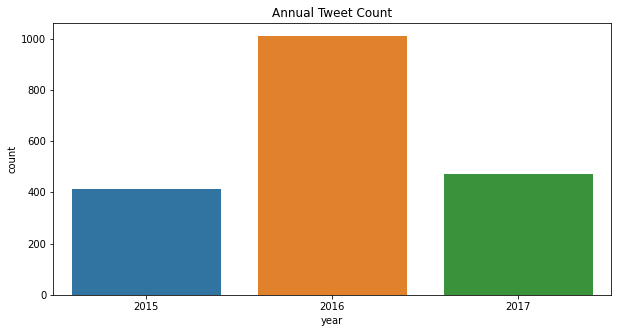

In [85]:
plt.figure(figsize=(10,5))
sns.countplot(x = 'year', data = twitter_archive_master_clean_df)
plt.title('Annual Tweet Count')
plt.show()

2016 had leading tweets

**Month with the highest tweets**

In [86]:
twitter_archive_master_clean_df.month.value_counts()

12    314
11    251
1     235
3     179
2     176
7     146
6     137
4     109
5     108
10     88
9      79
8      70
Name: month, dtype: int64

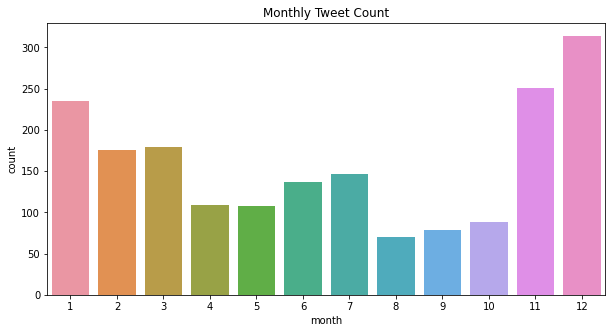

In [87]:
plt.figure(figsize=(10,5))
sns.countplot(x = 'month', data = twitter_archive_master_clean_df)
plt.title('Monthly Tweet Count')
plt.show()

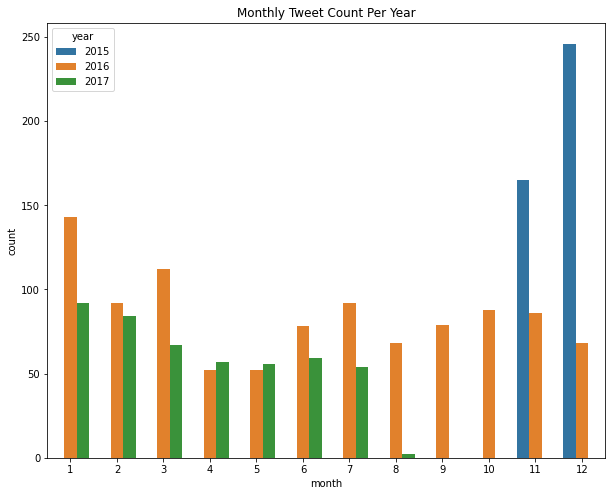

In [88]:
plt.figure(figsize=(10,8))
sns.countplot(x = 'month', data = twitter_archive_master_clean_df, hue='year')
plt.title('Monthly Tweet Count Per Year')
plt.show()

December 2015 had the highest number of tweets

**Source of Tweets**

In [89]:
twitter_archive_master_clean_df.source.value_counts()

iPhone        1778
Vine            84
Web Client      21
tweetdeck        9
Name: source, dtype: int64

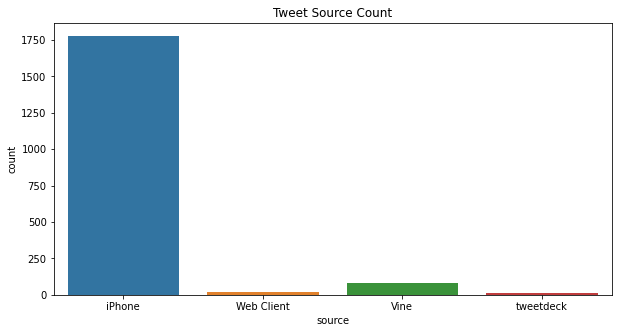

In [90]:
plt.figure(figsize=(10,5))
sns.countplot(x = 'source', data = twitter_archive_master_clean_df)
plt.title('Tweet Source Count')
plt.show()

Iphone users made the highest tweets

#### Bivariate Visualizations

In [91]:
twitter_archive_master_clean_df.columns

Index(['id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'expanded_urls',
       'rating_numerator', 'rating_denominator', 'name', 'stage',
       'favourites_count', 'retweet_count', 't_link', 'month', 'week',
       'day_of_the year', 'year'],
      dtype='object')

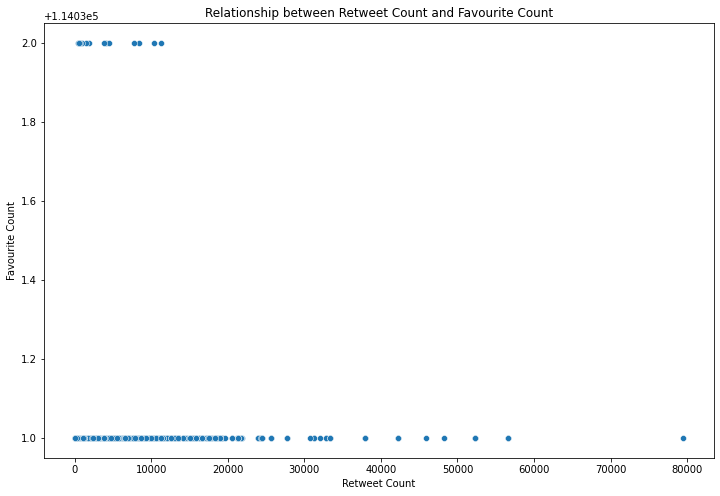

In [92]:
plt.figure(figsize=(12,8))
sns.scatterplot( x='retweet_count', y= 'favourites_count', data = twitter_archive_master_clean_df ,)
plt.title('Relationship between Retweet Count and Favourite Count')
plt.xlabel('Retweet Count')
plt.ylabel('Favourite Count')
plt.show()

### Insights:
1. 2016 had the highest number of tweets, followed by 2017 then 2015

2. December had the highest number of tweets and August being the least in general

3. Majority of tweeters used iPhone

### Pandas Profiling Report Analytics

In [93]:
# import seaborn as sns
from pandas_profiling import ProfileReport

In [94]:
profile = ProfileReport(twitter_archive_master_clean_df, title="act_report")

In [95]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [96]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [97]:
profile.to_file("act_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]